In [1]:
!mkdir -p data/interim
!mkdir -p img/clusterplots
!mkdir -p img/closer_looks

# Imports & Global Options

In [2]:
import sys
assert sys.version.split()[0] == "3.8.5", "This notebook should be run with an environment created from 'environment.yml'!"

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.cm import get_cmap
from tqdm.notebook import tqdm
from sklearn.cluster import DBSCAN
from collections import Counter
from collections.abc import Iterable
from dtaidistance.dtw_ndim import distance_fast as dist_DTW_fast
from scipy.cluster.hierarchy import linkage
from os.path import isfile

pd.set_option("display.max_columns", 100)
cmap = get_cmap('tab20')

# Functions
### General

In [3]:
def dist(a, b):
    #Euclidean distance between points a and b.
    return np.sqrt(abs(a[0]-b[0])**2+abs(a[1]-b[1])**2)

def dist_DTW(ax, ay, bx, by): #Unused due to running time concerns, instead using dtaidistance.dtw_ndim.distance_fast
    ax = np.array(ax)
    ay = np.array(ay)
    bx = np.array(bx)
    by = np.array(by)
    assert len(ax) == len(ay), f"Length of a's x- and y-components are not equal! ({len(ax)} != {len(ay)})"
    assert len(bx) == len(by), f"Length of b's x- and y-components are not equal! ({len(bx)} != {len(by)})"
    n, m = len(ax), len(bx)
    DTW = np.full(shape=(n, m), fill_value = np.inf)
    
    DTW[0, 0] = 0
    for i in range(n):
        for j in range(m):
            if i==j==0:
                continue
            cost = dist((ax[i], ay[i]), (bx[j], by[j]))
            DTW[i, j] = cost + min(DTW[i-1, j  ],    # insertion
                                   DTW[i  , j-1],    # deletion
                                   DTW[i-1, j-1])    # match
    return DTW[-1,-1]

def scale720_360(L):
    return np.array(L)/2

def round_to_nearest(x, N):
    return N * round(x/N)

def within50(item, s):
    #Within 50 px (in all directions) of any item in s 
    for other in s:
        if all([abs(a-b) <= 50 for a,b in zip(item, other)]):
            return True
    return False

def ccw(A,B,C):
    # https://bryceboe.com/2006/10/23/line-segment-intersection-algorithm/
    return (C[1]-A[1]) * (B[0]-A[0]) > (B[1]-A[1]) * (C[0]-A[0])

def crosses_line(xs_a, ys_a, xs_line, ys_line):
    # https://bryceboe.com/2006/10/23/line-segment-intersection-algorithm/
    assert len(xs_a) == 2, f"Length of xs_a is not 2! ({xs_a} has length {len(xs_a)})"
    assert len(ys_a) == 2, f"Length of ys_a is not 2! ({ys_a} has length {len(ys_a)})"
    assert len(xs_line) == len(ys_line), f"Length of xs_line and ys_line are not equal! ({len(xs_line)} != {len(ys_line)})"
    
    if len(xs_line) > 2:
        return bool(sum([crosses_line(xs_a, ys_a, xs_line[i:i+2], ys_line[i:i+2]) for i in range(len(xs_line)-1)]))
    
    A = (xs_a[0],ys_a[0])
    B = (xs_a[1],ys_a[1])
    C = (xs_line[0],ys_line[0])
    D = (xs_line[1],ys_line[1])
    return ccw(A,C,D) != ccw(B,C,D) and ccw(A,B,C) != ccw(A,B,D)

### Functions for Plotting

In [4]:
def get_filtered_bg_img(*, stepsize=10, overwrite=False):
    img_path = "vid/09-06-2021-mpeg4-360p-1h.png"
    if overwrite or not isfile(img_path):
        vc = cv2.VideoCapture("vid/09-06-2021-mpeg4-360p-1h.m4v")
        vc.set(cv2.CAP_PROP_POS_FRAMES, 0)
        amount_of_frames = int(vc.get(cv2.CAP_PROP_FRAME_COUNT))

        filtered_bg_img = cv2.cvtColor(vc.read()[1][::-1], cv2.COLOR_BGR2RGB).astype(float)
        for frame_num in tqdm(range(1,amount_of_frames,stepsize)):
            vc.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
            filtered_bg_img += cv2.cvtColor(vc.read()[1][::-1], cv2.COLOR_BGR2RGB)
        filtered_bg_img = (filtered_bg_img/(amount_of_frames/stepsize))
        plt.imsave(img_path, filtered_bg_img/256) #Will save it upside-down. This is intended.
        filtered_bg_img = filtered_bg_img.astype(int)
    else:
        filtered_bg_img = plt.imread(img_path)
    plt.imshow(filtered_bg_img)
    plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])
    plt.gca().axis('off')
    return filtered_bg_img

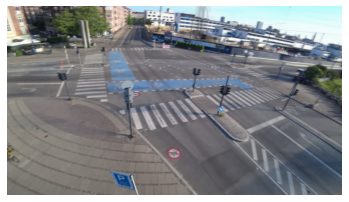

In [5]:
#Video
def makeplot(*, df = None, frame = 30, alpha = 1, overlay=False, ax=None, frame_info = False, legend=False, hide_axes=True, hide_frame=False, bg_img=None):
    if not overlay and not ax:
        fig = plt.figure()
    if bg_img is None:
        bg_img = get_filtered_bg_img()
    if ax:
        ax.imshow(bg_img.astype(float), alpha=alpha)
        ax.invert_yaxis()
    else:
        plt.imshow(bg_img, alpha=alpha)
        plt.gca().invert_yaxis()
    #plt.axis("equal");
    if hide_axes:
        plt.xticks([])
        plt.yticks([])
    if hide_frame:
        plt.gca().axis('off')
    if df is not None:
        count = 0
        for i, obj in tqdm(df.iterrows(), total = len(df)):
            if not (obj["frame_in"] <= frame <= obj["frame_out"]):
                continue
            count += 1
            rel_frame = frame-obj["frame_in"]
            if frame_info:
                print(f'Frame info: {obj["frame_in"]:>3}<={frame:>4}<={obj["frame_out"]:>4} (Rel.: {rel_frame:>4})\tFirst 5: {obj["xs_640x360"][:5]}, Len: {len(obj["xs_640x360"]):>4}')
            if ax:
                ax.scatter(obj["xs_640x360"][rel_frame], obj["ys_640x360"][rel_frame], label=("" if legend else "_")+f'{obj["id"]:>3}: {obj["class"]}')
            else:
                plt.scatter(obj["xs_640x360"][rel_frame], obj["ys_640x360"][rel_frame], label=("" if legend else "_")+f'{obj["id"]:>3}: {obj["class"]}')
        if count and legend:
            if ax:
                ax.legend(bbox_to_anchor=(1,0.5), loc="center left", prop={'family': 'monospace'})
            else:
                plt.legend(bbox_to_anchor=(1,0.5), loc="center left", prop={'family': 'monospace'})
    if ax:
        return ax
    if not overlay:
        return fig

makeplot(alpha=0.85).savefig("img/intersection.png")

In [6]:
def plot_clusters_and_subclusters(df_clustered, *, alpha=1, outline=True):
    #Ignore the multiple plots warning
    for src_dst_cluster_id in tqdm(sorted(df_clustered["src_dst_cluster_adj"].unique())):
        src_dst_cluster_mask = df_clustered["src_dst_cluster_adj"] == src_dst_cluster_id
        src_dst_cluster = df_clustered[src_dst_cluster_mask]

        #Top plot
        main_fig, main_ax = plt.subplots()
        makeplot(ax=main_ax, alpha=alpha)
        
        for do_outline in ([True, False] if outline else [False]):
            for rowid,path in src_dst_cluster.iterrows():
                if do_outline:
                    plt.plot(path["xs_640x360"], path["ys_640x360"], color=path["pathing_cluster_color"],
                        path_effects=[
                            path_effects.Stroke(linewidth=5, foreground='black'),
                            path_effects.Normal()
                        ]
                    )
                else:
                    plt.plot(path["xs_640x360"], path["ys_640x360"], color=path["pathing_cluster_color"])
        plt.title(f"Source-Destination Cluster {src_dst_cluster_id} ({len(src_dst_cluster)} samples)")
        main_fig.tight_layout()
        main_fig.savefig(f"img/clusterplots/full_src_dst_cluster{src_dst_cluster_id}")
        
        
        #Alt plot w/ directional arrow
        alt_fig, alt_ax = plt.subplots()
        makeplot(ax=alt_ax, alpha=alpha)
        startx = src_dst_cluster["xs_640x360"].apply(lambda L: L[0]).mean()
        starty = src_dst_cluster["ys_640x360"].apply(lambda L: L[0]).mean()
        endx = src_dst_cluster["xs_640x360"].apply(lambda L: L[-1]).mean()
        endy = src_dst_cluster["ys_640x360"].apply(lambda L: L[-1]).mean()
        plt.arrow(startx, starty, endx-startx, endy-starty, color="k", length_includes_head=True, width=1, head_width=20)
        
        plt.title(f"Start- and end points of Source-Destination Cluster {src_dst_cluster_id}\n({len(src_dst_cluster)} samples)")
        alt_fig.tight_layout()
        alt_fig.savefig(f"img/clusterplots/direction_src_dst_cluster{src_dst_cluster_id}")
        plt.close(alt_fig)
        
        
        #Small plots
        labeled = set()
        fig, ax = plt.subplots(5, 4, figsize=(16,16))
        fig.suptitle(f"Source-Destination Cluster {src_dst_cluster_id}")
        for do_outline in [True, False]:
            for rowid,path in src_dst_cluster.sort_values("pathing_cluster").iterrows():
                path_id = path["pathing_cluster"]-1
                this_ax = ax[path_id//4, path_id%4]
                if path_id not in labeled:
                    makeplot(ax=this_ax, alpha=alpha)
                    this_ax.set_xticks([])
                    this_ax.set_yticks([])
                    this_ax.plot(path["xs_640x360"], path["ys_640x360"], color=path["pathing_cluster_color"],
                        path_effects=[
                            path_effects.Stroke(linewidth=5, foreground='black'),
                            path_effects.Normal()
                        ]
                    )
                    this_ax.set_title(f'Path Cluster {path["pathing_cluster"]} ({np.sum(src_dst_cluster["pathing_cluster"] == path["pathing_cluster"])})')
                    labeled.add(path_id)
                    this_ax.scatter(path["xs_640x360"][0], path["ys_640x360"][0], color="g")
                    this_ax.scatter(path["xs_640x360"][-1], path["ys_640x360"][-1], color="r")
                else:
                    if do_outline:
                        this_ax.plot(path["xs_640x360"], path["ys_640x360"], color=path["pathing_cluster_color"],
                            path_effects=[
                                path_effects.Stroke(linewidth=5, foreground='black'),
                                path_effects.Normal()
                            ]
                        )
                    else:
                        this_ax.plot(path["xs_640x360"], path["ys_640x360"], color=path["pathing_cluster_color"])
        fig.tight_layout()
        fig.savefig(f"img/clusterplots/src_dst_cluster{src_dst_cluster_id}")

### Data Import and Preprocessing

In [7]:
def get_data():
    df_frames_adjusted = pd.read_pickle("data/raw/traj_01_elab_latest.pkl")
    df_frames_adjusted.drop(columns=[col for col in df_frames_adjusted.columns if col not in {"frame_in", "frame_out", "num_frames"}], inplace=True)
    
    df = pd.read_pickle("data/raw/traj_01_elab.pkl") #df_raw
    
    df["frame_in"] = df_frames_adjusted["frame_in"]
    df["frame_out"] = df_frames_adjusted["frame_out"]
    df["num_frames"] = df_frames_adjusted["num_frames"]
    del df_frames_adjusted
    
    # Calculate time on screen in seconds
    df["time_on_screen_s"] = df["num_frames"]/30

    # Make 360p
    df["x_start_640x360"] = scale720_360(df["x0"])
    df["x_end_640x360"]   = scale720_360(df["x1"])
    df["y_start_640x360"] = scale720_360(df["y0"])
    df["y_end_640x360"]   = scale720_360(df["y1"])

    # Drop incomplete paths
    print(f"Original shape of df: {df.shape}")
    df.drop(index=df.index[df["frame_in"] == 0], inplace=True)
    df.drop(index=df.index[df["frame_out"] == max(df["frame_out"])], inplace=True)

    # Drop various unused columns
    df.drop(columns=["entry_gate", "entry_time", "exit_gate", "exit_time"], inplace=True) # Masked
    df.drop(columns=["travelled_dist_px", "avg_speed_kph_h", "total_accs", "speeds_kpx_h"], inplace=True) # Imprecise due to perspective
    df.drop(columns=["xs", "ys", "x0", "x1", "y0", "y1"], inplace=True) # In 720p, I'm working with the 360p video
    df.drop(columns=["length"], inplace=True) #Currently unscaled and unused
    df.drop(columns=[xy+str(N)+"_"+str(i) for N in [4,10] for i in range(1,N) for xy in "xy"], inplace=True) #Quantiles
    df.drop(columns=[col for col in df.columns if col.startswith("cluster")], inplace=True) #Initialized clustering columns
    df.drop(columns=["times"], inplace=True) #Currently unused and takes up too much storage
    
    return df

### Clustering (DBSCAN)

In [8]:
def cluster(df, eps, min_samples):
    dbscan = DBSCAN(
        eps = eps, #Neighborhood distance
        min_samples = min_samples #Number of nearby samples to make a core point
    )
    dbscan.fit(df[["x_start_640x360", "x_end_640x360", "y_start_640x360", "y_end_640x360"]])
    return dbscan.labels_

def make_and_plot_groups(df, eps, min_samples, pointalpha=0.1, plotungrouped=False, short_desc=False):
    assert isinstance(eps, int) or isinstance(min_samples, int), "Cannot vary both eps and min_samples at the same time!"
    variablefactor = ("eps" if isinstance(eps, Iterable) else "min_samples" if isinstance(min_samples, Iterable) else False)
    
    for _var in (eps if isinstance(eps, Iterable) else min_samples if isinstance(min_samples, Iterable) else [None]): #Allow iteration over either list of eps or min_samples (determined at runtime)
        eps = (eps if variablefactor != "eps" else _var)
        min_samples = (min_samples if variablefactor != "min_samples" else _var)
        
        clusters = cluster(df, eps, min_samples)
        counts = Counter(clusters)
        cats = dict(counts.most_common(20))

        if -1 in cats:
            cats = dict(counts.most_common(21))
            del cats[-1]

        print(f"{len(cats)} paths found for eps={eps} and min_samples={min_samples}. {sum(cats.values())} out of {len(df)} total datapoints clustered.")

        cat_colors = {cat:cmap(cat/20) for idx,(cat,_) in enumerate(sorted(cats.items(), key=lambda x: -x[1]))}
        for cat in clusters:
            if cat == -1:
                cat_colors[cat] = (0,0,0,1)
            elif cat not in cat_colors:
                cat_colors[cat] = (1,1,0,1)
        sample_colors = [cat_colors[cat] for cat in clusters]
        
        
        seen = set()
        named_paths = {
            (200,300,300,300): "N->E (Left Turn; pedestrian shortcut)" if short_desc else "North -> East  (Left Turn; shortcut over pedestrian crossing)",
            (200,250,600,100): "N->S (Straight; blue track)" if short_desc else "North -> South (Straight; blue track)",
            (250,200,650,100): "N->S (Straight; blue track)" if short_desc else "North -> South (Straight; blue track)",
            (200,250,  0,250): "N->W (Right Turn)" if short_desc else "North -> West  (Right Turn)",
            
            (350,250,  0,250): "E->W (Straight)" if short_desc else "East  -> West  (Straight)",
            (400,250,  0,250): "E->W (Straight)" if short_desc else "East  -> West  (Straight)",
            (450,250,  0,250): "E->W (Straight)" if short_desc else "East  -> West  (Straight)",
            (350,250,600,100): "E->S (Right Turn; pedestrian shortcut)" if short_desc else "East  -> South (Right Turn; shortcut over pedestrian crossing)",
            (350,250,650,100): "E->S (Right Turn; pedestrian shortcut)" if short_desc else "East  -> South (Right Turn; shortcut over pedestrian crossing)",
            (350,300,650,100): "E->S (Right Turn; pedestrian shortcut)" if short_desc else "East  -> South (Right Turn; shortcut over pedestrian crossing)",
            
            (650,150,  0,250): "S->W (Left Turn)" if short_desc else "South -> West  (Left Turn)",
            (650,150, 50,250): "S->W (Left Turn)" if short_desc else "South -> West  (Left Turn)",
            (650,150,100,250): "S->W (Left Turn)" if short_desc else "South -> West  (Left Turn)",
            (650,150,300,300): "S->N (Straight)" if short_desc else "South -> North (Straight)",
            (550,200,300,300): "S->N (Straight)" if short_desc else "South -> North (Straight)",
            (650,150,550,250): "S->E (Right Turn)" if short_desc else "South -> East  (Right Turn)",
            (650,150,550,150): "S -- *Cut* at stopline" if short_desc else "South -- *Cut* at stopline",
            
            (  0,200,550,250): "W->E (Straight)" if short_desc else "West  -> East  (Straight)",
            (  0,200,500,250): "W->E (Straight)" if short_desc else "West  -> East  (Straight)",
            (  0,200,650,100): "W->S (Right Turn; ½ blue track)" if short_desc else "West  -> South (Right Turn; ½ blue track)",
            
            (250,200,600,100): "N/W *Cut* -- S (Right/Straight; ½ blue track)" if short_desc else "*Cut* -- South (From North or West; Right Turn or Straight; ½ blue track)",
            
        }
        
        for group,color in tqdm(sorted(cat_colors.items(), key=lambda x: x[0])[:21]):
            if group == -1 and not plotungrouped:
                makeplot(alpha=0.5)
                continue
            mask = np.array([sample_color == color for sample_color in sample_colors])
            if group == -1:
                makeplot(alpha=0.5)
                plt.title(f"Ungrouped samples")
            else:
                makeplot(alpha=0.5, overlay=True)
                plt.title(f"eps={eps}; min_samples={min_samples}:\n{len(cats)} src-dst clusters - {sum(cats.values())}/{len(df)} datapoints", fontsize=10)
                example_xs = df["xs_640x360"][mask].iloc[0]
                example_ys = df["ys_640x360"][mask].iloc[0]
                ends = (example_xs[0], example_ys[0], example_xs[-1], example_ys[-1])
                rounded_ends = tuple(round_to_nearest(num, 50) for num in ends)
                endcoords = f"({rounded_ends[0]:>3},{rounded_ends[1]:>3})->({rounded_ends[2]:>3},{rounded_ends[3]:>3})" if not rounded_ends in named_paths else named_paths[rounded_ends]
                if endcoords in named_paths:
                    endcoords = named_paths[endcoords]
                plt.plot(example_xs, example_ys, color=color, alpha=1, linewidth=4, linestyle="--",
                    label=f"{'(Duplicate) ' if within50(ends, seen) else ''}{group:>2}: {endcoords}",
                    path_effects=[
                        path_effects.Stroke(linewidth=5, foreground='black'),
                        path_effects.Normal()
                    ]
                )
                seen.add(ends)
                plt.legend(bbox_to_anchor=(1,0.5), loc="center left", prop={'family': 'monospace','size':7})
            plt.scatter(df["x_start_640x360"][mask], df["y_start_640x360"][mask], color=(0,0,0,0), edgecolors=color, alpha=pointalpha, zorder=100)
            plt.scatter(df["x_end_640x360"][mask], df["y_end_640x360"][mask], color=(0,0,0,0), edgecolors=color, alpha=pointalpha, zorder=100)
            if group == -1:
                makeplot(alpha=0.5)
    if not variablefactor:
        return clusters

#Best (eps, min_samples) = (9, 25)

### Clustering (Dynamic Time Warping)

In [9]:
def hierarchial_cluster_dtw(df):
    distance_matrix = [
        dist_DTW_fast(
            np.column_stack([row1["xs_640x360"],row1["ys_640x360"]]),
            np.column_stack([row2["xs_640x360"],row2["ys_640x360"]])
        )
        for idx1,row1 in tqdm(df.iterrows(), total=len(df))
        for idx2,row2 in df.iterrows()
        if idx1<idx2
    ]
    return distance_matrix #1-D condensed distance matrix

In [10]:
def clustercolors(linkage_, n_clusters=None, cluster_size_break=None):
    assert n_clusters is None or 1 <= n_clusters <= 20, "Keyword argument 'n_clusters' must be between 1 and 20 (both inclusive)!"
    n = len(linkage_)+1
    clusters = {k:{k} for k in range(n)}
    for idx,(i,j,_,_) in enumerate(linkage_):
        i, j = int(i), int(j)
        joined = clusters[i].union(clusters[j])
        if cluster_size_break and len(joined) >= cluster_size_break:
            break
        clusters[n+idx] = joined
        del clusters[i]
        del clusters[j]
        if len(clusters) == n_clusters:
            break
    
    pathing_clusters = np.full(n,fill_value=None)
    colors = np.full(n,fill_value=None)
    cluster_sizes = np.full(n,fill_value=None)
    for idx,(cluster,samples) in enumerate(sorted(clusters.items(), key=lambda x: -len(x[1]))):
        for sample in samples:
            pathing_clusters[sample] = idx
            colors[sample] = cmap(idx/20)
            cluster_sizes[idx] = len(samples)
    
    return pathing_clusters, colors, cluster_sizes

### Storing, loading & creating clustered data

In [11]:
def get_or_create_clustered_df(*, overwrite = False):
    if overwrite:
        print("Keyword argument 'overwrite' set to true. Overwriting saved interim data.")
    else:
        if isfile("data/interim/df_bike_clustered.pickle"):
            print("File 'data/interim/df_bike_clustered.pickle' found. Loading it.")
            df_bike_clustered = pd.read_pickle("data/interim/df_bike_clustered.pickle")
            return df_bike_clustered
        
        print("File 'data/interim/df_bike_clustered.pickle' not found.")
    
    
    
    print("Creating df_bike_clustered... (This may take a while - like 90 minutes or so.)")

    if isfile("data/interim/df_bike.pickle"):
        print("\tFeching preprocessed and filtered data...")
        df_bike = pd.read_pickle("data/interim/df_bike.pickle")
    else:
        print("\tFetching and preprocessing raw data...")
        df = get_data()

        print("\tFiltering for bicycles...")
        df_bike = df[:][df["class"] == "Bicycle"]
        
        print("\tSaving non-clustered dataframe...")
        df_bike.to_pickle("data/interim/df_bike.pickle")
        del df #Clear some memory
        

    print("\tClustering w/ DBSCAN...")
    clusters = make_and_plot_groups(df_bike, 9, 25, pointalpha=1)
    df_bike["src_dst_cluster_orig"] = clusters

    print("\tAdjusting clusters...")
    recoding_dict = {
            5:16, 10:16,
            7:17, 8:17,
            1:18, 15:18,
            4:19, 13:19,
            11:-1, 12:-1, 6:-1
        }
    df_bike["src_dst_cluster_adj"] = [
        cluster if cluster not in recoding_dict
        else recoding_dict[cluster]
        for cluster in df_bike["src_dst_cluster_orig"]
    ]

    print("\tDropping messy points")
    df_bike_clustered = df_bike[df_bike["src_dst_cluster_adj"] != -1][:]
    del df_bike #Clear up some memory


    print("\tRelabeling clusters...")
    #Because not all cluster ids exist, recode to range (1 to n for readability):
    pre_cluster_ids = sorted(np.unique(df_bike_clustered["src_dst_cluster_adj"]), key=lambda x: -np.sum(df_bike_clustered["src_dst_cluster_adj"] == x))
    recoding_dict = {pre:post for pre,post in zip(pre_cluster_ids, range(1,len(pre_cluster_ids)+1))}
    post_clusters = [recoding_dict[cluster_id] for cluster_id in df_bike_clustered["src_dst_cluster_adj"]]
    df_bike_clustered["src_dst_cluster_adj"] = post_clusters



    print("\tSubclustering hierarchically on DTW-Distance...")
    df_bike_clustered["pathing_cluster"] = None
    df_bike_clustered["pathing_cluster_color"] = None
    df_bike_clustered["pathing_cluster_size"] = None
    for src_dst_cluster in tqdm(df_bike_clustered["src_dst_cluster_adj"].unique()):
        src_dst_cluster_mask = df_bike_clustered["src_dst_cluster_adj"] == src_dst_cluster
        #SettingWithCopyWarning.
        df_bike_clustered["pathing_cluster"][src_dst_cluster_mask], df_bike_clustered["pathing_cluster_color"][src_dst_cluster_mask], df_bike_clustered["pathing_cluster_size"][src_dst_cluster_mask] = clustercolors(
            linkage(
                hierarchial_cluster_dtw(
                    df_bike_clustered[src_dst_cluster_mask]
                ),
                method="median"
            ),
            n_clusters=20
        )
    df_bike_clustered["pathing_cluster"] += 1 #Recode from 0..N-1 to 1..N

    print("\tSaving...")
    df_bike_clustered.to_pickle("data/interim/df_bike_clustered.pickle")
    
    return df_bike_clustered

### Deeper analysis

In [12]:
def closer_look_at_cluster_n(df_clustered, src_dst_cluster_id, *, alpha=1):
    src_dst_cluster_mask = df_clustered["src_dst_cluster_adj"] == src_dst_cluster_id
    src_dst_cluster = df_clustered.drop(columns="pathing_cluster")[src_dst_cluster_mask]
    
    for measure_label, measure_colname, cbar_label, reverse, dropna, linealpha in [
        ("time on screen","time_on_screen_s","Time on screen in s\n(Yellow=Fast, Blue=Slow)", True, False, 0.55), #Supports adding other measures as well
    ]:
        main_fig, main_ax = plt.subplots()
        makeplot(ax=main_ax, alpha=alpha)
        max_ = src_dst_cluster[measure_colname].max()
        for rowid,path in src_dst_cluster.iterrows():
            if dropna and path[measure_colname] is None:
                continue
            plt.plot(path["xs_640x360"], path["ys_640x360"], alpha=linealpha, color=get_cmap("plasma")(abs(int(reverse)-path[measure_colname]/max_)))
        plt.title(f"Source-Destination Cluster {src_dst_cluster_id} ({len(src_dst_cluster)} samples)\n(Coloring based on {measure_label})")

        plt.scatter([],[], c=[], cmap=get_cmap("plasma"+("_r" if reverse else ""))) #Allows the colorbar
        cbar = plt.colorbar(
            cax = make_axes_locatable(main_ax).append_axes("right", size="5%", pad=0.05)
        )
        cbar.set_label(cbar_label)
        plt.clim(0, max_)
        measure_label = measure_label.replace(" ", "_")
        main_fig.savefig(f"img/closer_looks/closer_look_src_dst_cluster{src_dst_cluster_id}_{measure_label}")

# Data Loading, Preprocessing and Clustering

In [13]:
df_bike_clustered = get_or_create_clustered_df()
df_bike_clustered.head(2)

File 'data/interim/df_bike_clustered.pickle' found. Loading it.


,id,class,frame_in,frame_out,xs_640x360,ys_640x360,num_frames,time_on_screen_s,x_start_640x360,x_end_640x360,y_start_640x360,y_end_640x360,src_dst_cluster_orig,src_dst_cluster_adj,pathing_cluster,pathing_cluster_color,pathing_cluster_size
9,20,Bicycle,674,1655,"[2.97, 3.425, 3.905, 4.395, 4.885, 5.375, 5.84...","[193.985, 193.64, 193.275, 192.905, 192.53, 19...",982,32.733333,2.970,625.260,193.985,112.135,0,3,1,"(0.12156862745098039, 0.4666666666666667, 0.70...",365
10,22,Bicycle,798,1635,"[3.315, 3.475, 3.635, 3.8, 3.96, 4.125, 4.285,...","[191.145, 190.875, 190.595, 190.315, 190.035, ...",838,27.933333,3.315,507.185,191.145,228.700,8,5,1,"(0.12156862745098039, 0.4666666666666667, 0.70...",125


  0%|          | 0/9 [00:00<?, ?it/s]

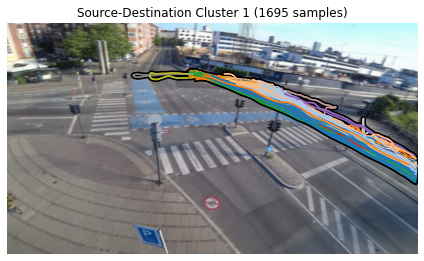

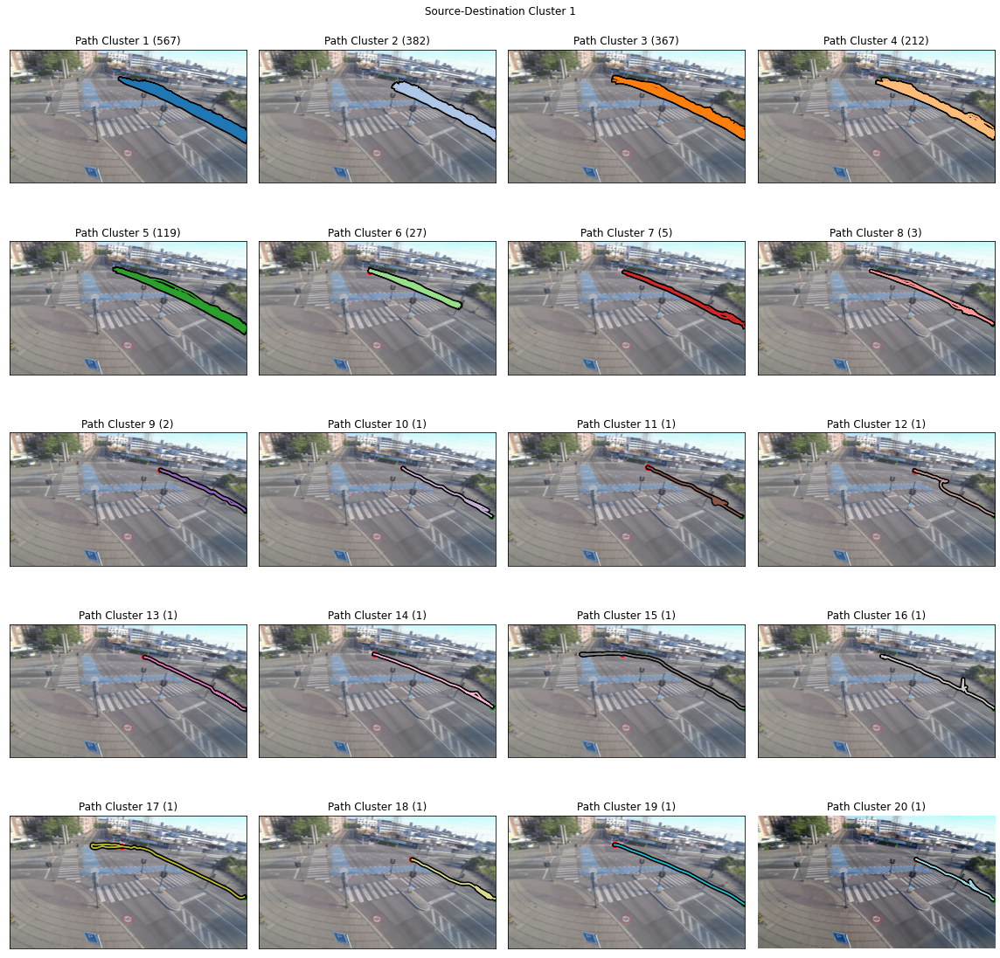

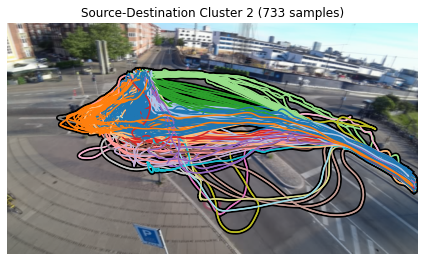

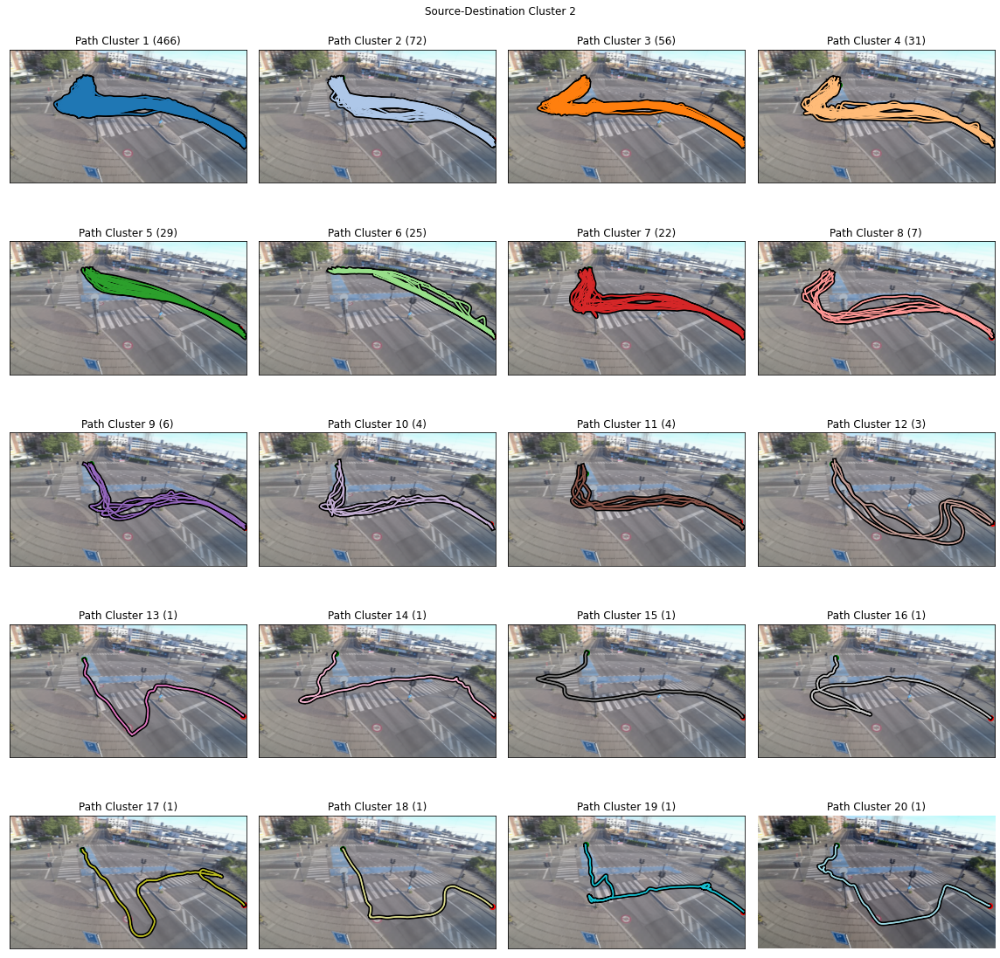

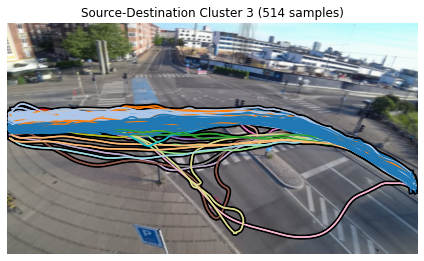

...

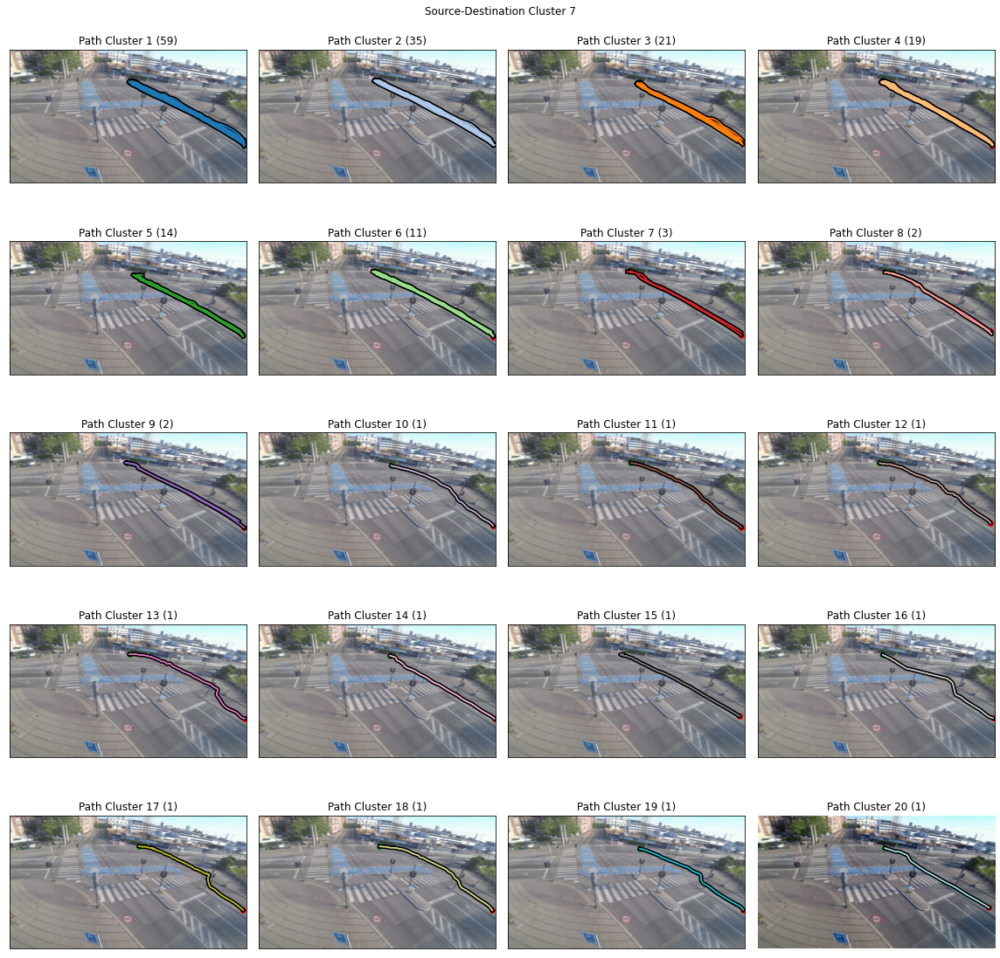

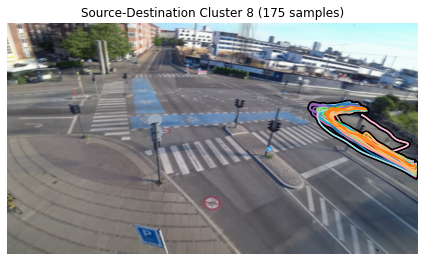

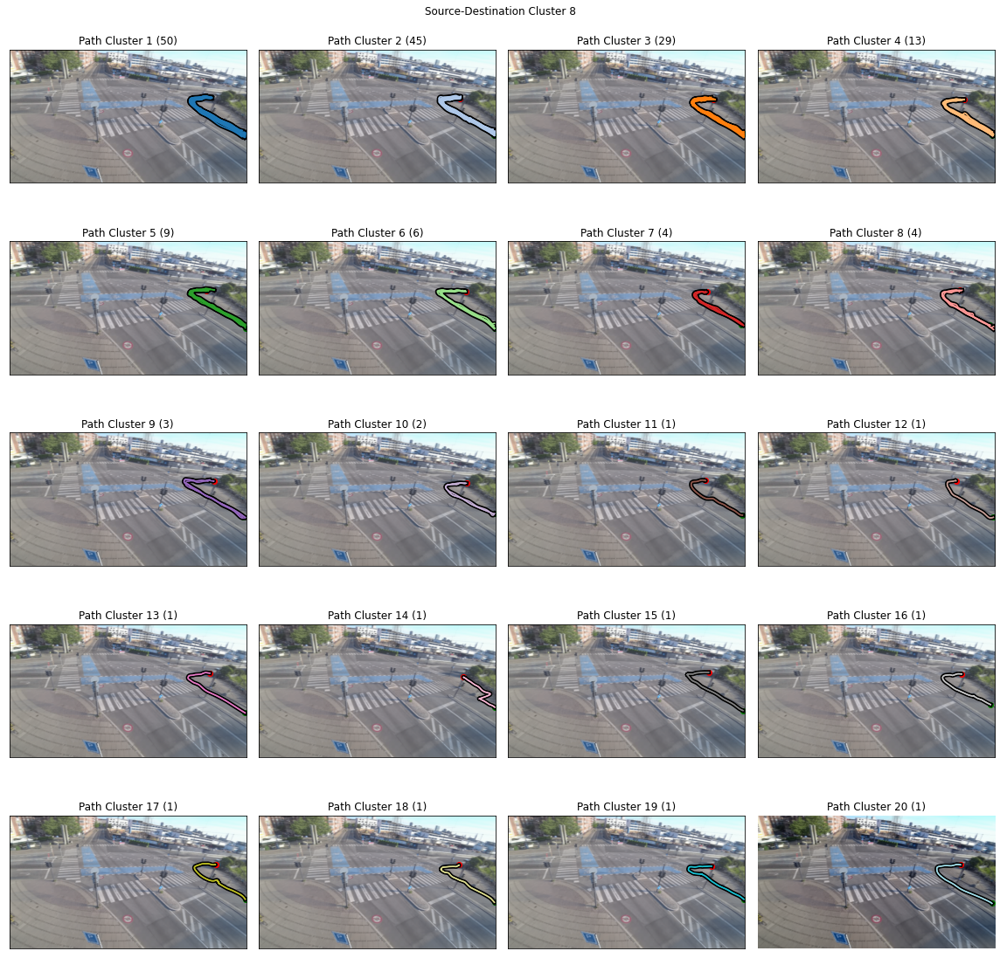

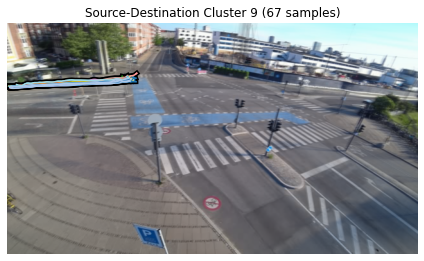

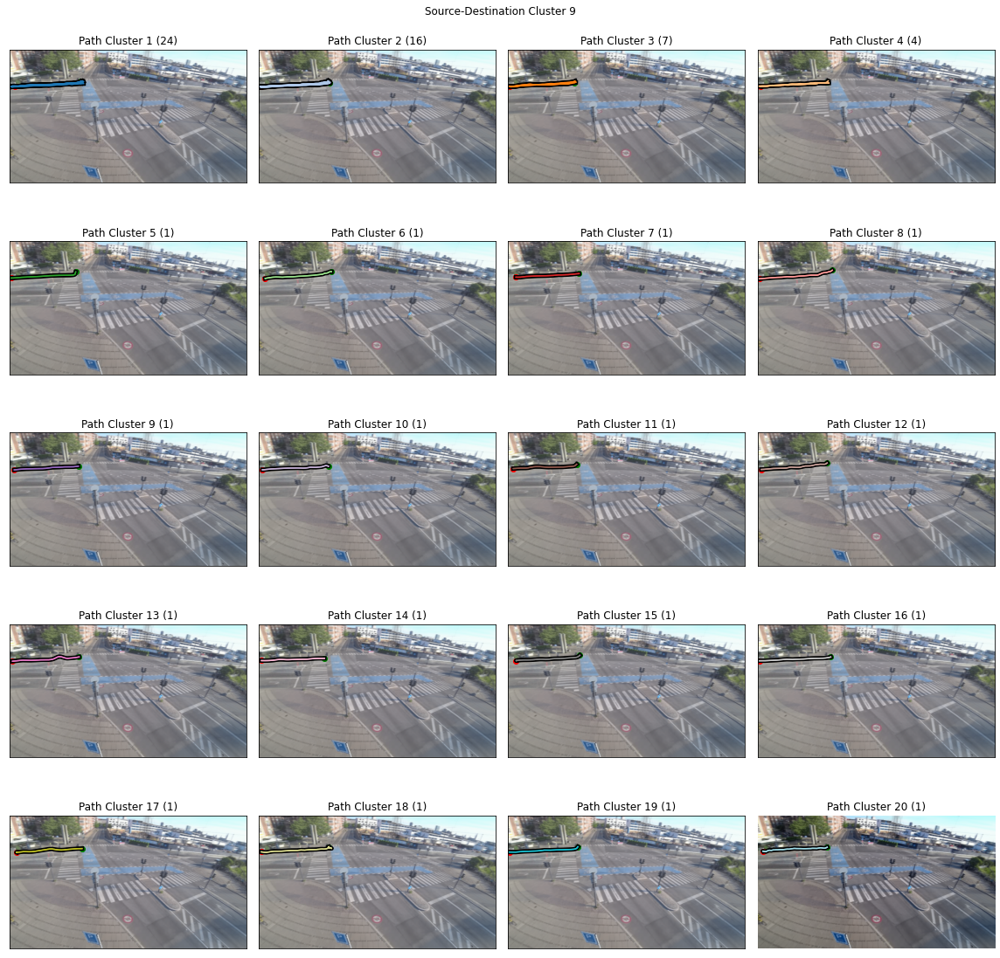

In [14]:
plot_clusters_and_subclusters(df_bike_clustered, alpha=0.85)

# Closer look at Source-Destination Cluster 2

### Crossing times

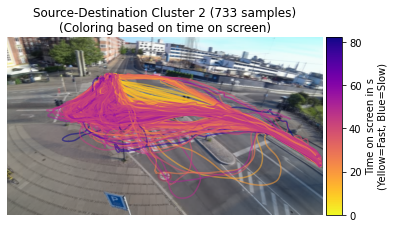

In [15]:
closer_look_at_cluster_n(df_bike_clustered, 2, alpha=0.85);

In [16]:
print("Descriptive statistics of time on screen in src_dst cluster 2 (N->S) by pathing cluster:")
df_bike_clustered[df_bike_clustered["src_dst_cluster_adj"] == 2].groupby("pathing_cluster")["time_on_screen_s"].describe()

Descriptive statistics of time on screen in src_dst cluster 2 (N->S) by pathing cluster:


,count,mean,std,min,25%,50%,75%,max
pathing_cluster,,,,,,,,
1,466.0,42.886981,7.628975,13.900000,39.341667,43.650000,47.541667,69.066667
2,72.0,27.592593,10.896026,9.366667,18.233333,27.466667,37.475000,47.433333
3,56.0,44.389881,5.010111,32.100000,41.166667,44.083333,46.900000,57.100000
4,31.0,40.031183,5.537294,29.600000,35.883333,40.200000,44.766667,50.700000
5,29.0,12.697701,5.958460,6.866667,9.933333,11.033333,11.966667,29.800000
6,25.0,32.468000,11.348542,14.300000,24.100000,30.700000,38.266667,60.466667
7,22.0,41.451515,8.740756,19.533333,36.383333,44.566667,47.158333,55.933333
8,7.0,42.033333,19.848799,22.300000,29.100000,34.066667,53.816667,72.033333
9,6.0,34.088889,6.581816,25.833333,30.216667,32.966667,37.841667,44.000000


# Crossing into "no-bicycle" zone

  0%|          | 0/4432 [00:00<?, ?it/s]

Number of bicycles crossing into no-bicycle zone by src_dst cluster:
src_dst_cluster_adj
1    0
2    9
3    3
4    0
5    0
6    0
7    0
8    0
9    0
Name: crosses_no_bicycle, dtype: int64

Total:12


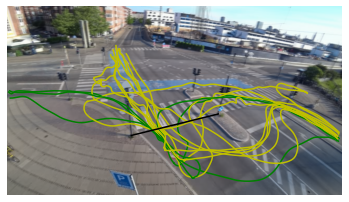

In [17]:
def crosses_no_biycle(df, inplace=False):
    if not inplace:
        df = df.copy()
        
    threshold_xs = (237, 403)
    threshold_ys = (360-247, 360-206)

    pd.DataFrame({"x_640x360": [threshold_xs], "y_640x360": [threshold_ys], "colors": [["r"]]})
    fig = makeplot()
    
    
    df["crosses_no_bicycle"] = False
    for idx, line in tqdm(df.iterrows(), total=len(df)):
        for frame_diff in range(len(line["xs_640x360"])-1):
            if crosses_line(
                line["xs_640x360"][frame_diff:frame_diff+2],
                line["ys_640x360"][frame_diff:frame_diff+2],
                threshold_xs,
                threshold_ys
            ):
                df.loc[idx, "crosses_no_bicycle"] = True
                fig.gca().plot(line["xs_640x360"], line["ys_640x360"], c="roygbiv"[line["src_dst_cluster_adj"]])
                break
    plt.plot(threshold_xs, threshold_ys, color="k")
                
    return df if not inplace else None



df_bike_clustered_crosses_no_bicycle = crosses_no_biycle(df_bike_clustered)
df_bike_clustered_crosses_no_bicycle.to_pickle("data/interim/df_bike_clustered_crosses_no_bicycle.pickle")
no_bicycle_crosses = df_bike_clustered_crosses_no_bicycle.groupby("src_dst_cluster_adj")["crosses_no_bicycle"].sum()
print("Number of bicycles crossing into no-bicycle zone by src_dst cluster:\n", no_bicycle_crosses, "\n\nTotal:", no_bicycle_crosses.sum(), sep="")